# Рынок заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» решили открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Наша задача — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего места.

В нашем распоряжении датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.


## Общая информация

Первым делом загрузим датасет и изучим основную информацию.

In [1]:
import pandas as pd
import datetime as dt
import matplotlib.pyplot as plt
from plotly import graph_objects as go
import seaborn as sns
from numpy import median
import plotly.express as px
from scipy import stats as st
import numpy as np
import math as mth
import folium
from folium import Map, Marker, Choropleth
from folium.plugins import MarkerCluster
import json

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.options.display.max_colwidth = 150

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Типы данных менять не будем.

In [4]:
data.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


В датасете следующие столбцы:
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа;
- middle_avg_bill — число с оценкой среднего чека;
- middle_coffee_cup — число с оценкой одной чашки капучино;
- chain — число, которое показывает, является ли заведение сетевым;
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

Всего представлено 8406 заведений, в данных явно есть пропуски и возможно дубликаты. Переходим к предобработке данных.

## Предобработка данных

Изучим, есть ли дубликаты в данных, найдем пропуски и решим, что с ними делать.
Так же добавим столбец "street" с названиями улиц для каждого заведения, столбец "is_24/7" с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

In [5]:
print('Количество пропусков: ', '\n', data.isna().sum())
print('\t')
print('Количество явных дубликатов:', data.duplicated().sum())

Количество пропусков:  
 name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64
	
Количество явных дубликатов: 0


In [6]:
for columns in data.columns:
    data['name'] = data['name'].str.lower() 
for columns in data.columns:
    data['address'] = data['address'].str.lower() 

exclude_list = ['.', '-',]
for rep in exclude_list:
    data['name'] = data['name'].str.replace(rep,' ', regex=True)
print('Количество неявных дубликатов:', data.duplicated(subset=['name','address']).sum())

Количество неявных дубликатов: 4


In [7]:
data = data.drop_duplicates(subset=['name','address'])
print('Количество неявных дубликатов:', data.duplicated(subset=['name','address']).sum())

Количество неявных дубликатов: 0


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8402 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              7867 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8402 non-null   int64  
 13  seats              4792 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 984.6+ KB


Явные дубликаты отсутсвуют, а вот пропусков большое количество. Появление такого количества пропусков не удивительно, данные собраны из сомнительных источников, избавиться от них не представляется возможным, рискуем сильно исказить данные. Заглушки так же не будем использовать, так как далее придется их учитывать.

Добавим столбцы "street" с названиями улиц для каждого заведения и "is_24/7" с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

In [9]:
data['street'] = data['address'].str.split(', ', expand = True)[1]
data_hours = data[data['hours'].notna()]
data['is_24/7'] = data_hours['hours'].str.contains('ежедневно, круглосуточно')
# в тех данных, в которых пропуски, по умолчанию укажем, что таковыми не являются
data['is_24/7'] = data['is_24/7'].fillna(False)
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


## Анализ данных

В этом блоке ответим на важные вопросы, такие как:
- Какие категории заведений представлены в данных?
- Какое количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее.
- Каких заведений больше?
- Какие категории заведений чаще являются сетевыми?
- Какие административные районы Москвы присутствуют в датасете?
- Сильно ли различаются усреднённые рейтинги в разных типах общепита?
- Какие топ-15 улиц по количеству заведений?
- На каких улицах находится только один объект общепита? Что можно сказать об этих заведениях?
- Как удалённость от центра влияет на цены в заведениях?

In [10]:
cat = data.groupby(['category']).agg({'name' : 'count'}).sort_values(by='name', ascending=False).reset_index()
cat

,category,name
0,кафе,2376
1,ресторан,2042
2,кофейня,1413
3,"бар,паб",764
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


Всего представлено 8 категорий заведений. Построим график распределения заведений.

In [11]:
fig = px.bar(cat, x='category', y='name', title='Количество заведений по категориям и процент от общего числа',
            labels={'category':'Тип заведений', 'name':'Количество заведений, шт.'}, color = 'category')
fig.update_layout(annotations=[{"x": x, "y": total * 1.05,"text":str(round(100 * total/data['category'].count(), 2)), "showarrow": False}
        for x, total in cat.groupby("category", as_index=False).agg({"name": "sum"}).values])
fig.show() 

Больше половины заведений представлены кафе и ресторанами, на третьем месте расположились кофейни.

In [12]:
cat_seats = (data.groupby(['category']).agg({'seats':lambda x: np.round(np.mean(x), decimals=2)}).
    sort_values(by='seats', ascending=False).reset_index())

fig = px.bar(cat_seats, x='category', y='seats', title='Среднее количество посадочных мест по категориям заведений',
            labels={'category':'Тип заведений', 'seats':'Среднее количество посадочных мест, шт', 'district':'Районы'},
            color = 'category')
fig.update_layout(annotations=[{"x": x, "y": total * 1.05, "text": str(total), "showarrow": False}
        for x, total in cat_seats.groupby("category", as_index=False).agg({"seats": "sum"}).values])
fig.show() 

Самое большое среднее количество посадочных мест в барах и ресторанах. Булочная же отстает от всех.

In [13]:
chain_count = pd.pivot_table(data, index = 'category', values = 'name', columns = ['chain'], aggfunc='count').sort_values(by=0, ascending=False).reset_index()
chain_count.rename(columns = {0:'not_chain', 1:'chain'}, inplace = True )
print(chain_count) 
print('\t')
print('Всего не сетевых заведений', chain_count['not_chain'].sum(), 'шт., что составляет', 
      round(chain_count['not_chain'].sum() * 100 / data['name'].count(), 2), '% от общего числа заведений')
print('\t')
print('Всего сетевых заведений', chain_count['chain'].sum(), 'шт., что составляет', 
      round(chain_count['chain'].sum() * 100 / data['name'].count(), 2), '% от общего числа заведений')

chain         category  not_chain  chain
0                 кафе       1597    779
1             ресторан       1313    729
2              кофейня        693    720
3              бар,паб        596    168
4      быстрое питание        371    232
5             пиццерия        303    330
6             столовая        227     88
7             булочная         99    157
	
Всего не сетевых заведений 5199 шт., что составляет 61.88 % от общего числа заведений
	
Всего сетевых заведений 3203 шт., что составляет 38.12 % от общего числа заведений


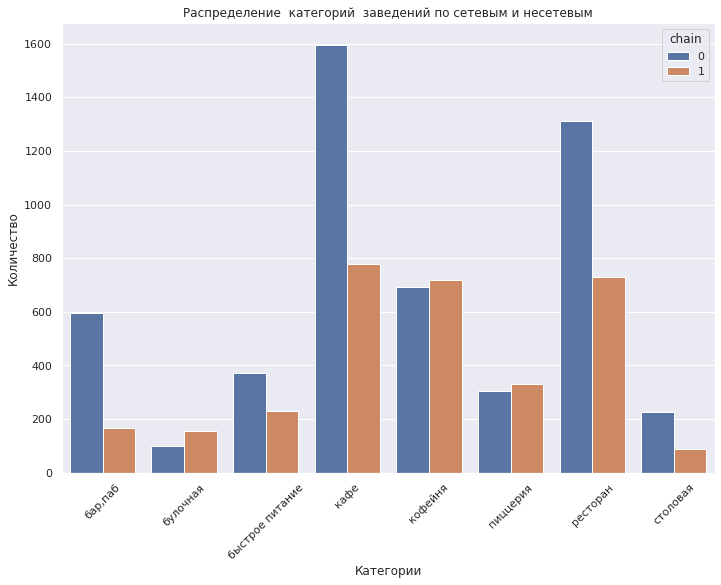

In [14]:
with plt.style.context('ggplot'):
    chain_category = data.groupby(['category','chain']).agg({'name' : 'count'})
    chain_category = chain_category.reset_index()
    sns.set(rc={'figure.figsize':(11.7,8.27)})
    sns.barplot(data=chain_category, x='category', y='name', hue='chain')
    plt.title('Распределение  категорий  заведений по сетевым и несетевым')
    plt.xlabel('Категории')
    plt.ylabel('Количество')
    plt.xticks(rotation=45);

Основная масса сетевых заведений это кафе,рестораны и кофейни. В то же время кафе и рестораны лидируют по количеству не сетевых экземпляров.

In [15]:
top = data.groupby(['name']).agg({'category' : 'count'}).sort_values(by='category', ascending=False).reset_index()
top.head(15)

,name,category
0,кафе,188
1,шоколадница,120
2,домино'с пицца,77
3,додо пицца,74
4,one price coffee,72
5,яндекс лавка,72
6,cofix,65
7,prime,50
8,хинкальная,44
9,шаурма,43


У самых часто встречающихся заведений Москвы, есть такие названия как "Кафе", "Шаурма" или "Ресторан". Это говорит либо об ошибке в первоначальных данных, либо о "большой" фантазии владельцев данных заведений. Остальные заведения многим известны, это действительно общепит, который встречается очень часто. Предлагаю избавиться от заведений с названием категории в дальнейшем графике.

In [16]:
chains = data[data['chain'] == 1]
top = (chains.pivot_table(index=['name', 'category'], values=["chain"], aggfunc='count')
       .sort_values(by='chain', ascending=False))
top_15 = top.head(15)
top_15

,,chain
name,category,
шоколадница,кофейня,119
домино'с пицца,пиццерия,76
додо пицца,пиццерия,74
яндекс лавка,ресторан,72
one price coffee,кофейня,71
cofix,кофейня,65
prime,ресторан,49
кофепорт,кофейня,42
кулинарная лавка братьев караваевых,кафе,39


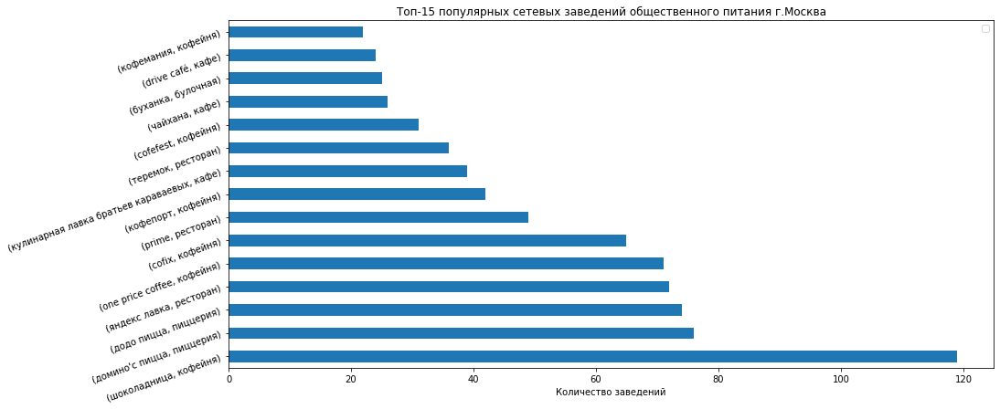

In [17]:
top_15.plot.barh(figsize=(15, 7))
plt.title('Топ-15 популярных сетевых заведений общественного питания г.Москва')
plt.xlabel('Количество заведений')
plt.ylabel('')
plt.yticks(rotation=20)
plt.legend('')
plt.show()

В основном здесь представлены заведения связанные с кофе. Так же есть 2 больших, известных заведения из категории пиццерий.

Далее рассмотрим районы Москвы.

In [18]:
print(data['district'].unique())
print('\t')
print('Всего в датасете представлены', len(data['district'].unique()), 'районов г.Москва')

['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']
	
Всего в датасете представлены 9 районов г.Москва


In [19]:
dist = pd.pivot_table(data, index = 'district', values = 'name', columns = 'category', aggfunc='count').reset_index()
dist

category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,Восточный административный округ,53,25,71,272,105,72,160,40
1,Западный административный округ,50,37,62,238,150,71,218,24
2,Северный административный округ,68,39,58,234,193,77,188,41
3,Северо-Восточный административный округ,62,28,82,269,159,68,182,40
4,Северо-Западный административный округ,23,12,30,115,62,40,109,18
5,Центральный административный округ,364,50,87,464,428,113,670,66
6,Юго-Восточный административный округ,38,13,67,282,89,55,145,25
7,Юго-Западный административный округ,38,27,61,238,96,64,168,17
8,Южный административный округ,68,25,85,264,131,73,202,44


In [20]:
district = (data.groupby(['district', 'category'],as_index=False)
        .agg(quantity=('category','count')).sort_values('quantity', ascending = False))
fig = px.bar(district, x='district', y='quantity', color='category', 
             title='Общее количество заведений и количество заведений каждой категории по районам', 
             labels={'category':'Тип заведений', 'quantity':'Общее кол-во заведений, шт', 'district':'Районы'}, width=1000, height=700)
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig.update_layout(annotations=[{"x": x, "y": total * 1.05, "text": str(total), "showarrow": False}
        for x, total in district.groupby("district", as_index=False).agg({"quantity": "sum"}).values])
fig.show()

Заведения по категориям распределены примерно одинаково. Самое большое количетсво заведений общепита в Центральном районе, 2242 шт. А в Северо-Западном наоборот, самое маленькое количество - всего 409 шт.

In [21]:
cat_rating = (data.groupby(['category']).agg({'rating':lambda x: np.round(np.mean(x), decimals=2)}).
    sort_values(by='rating', ascending=False).reset_index())
fig = px.bar(cat_rating, x='category', y='rating', 
             title='Усредненный рейтинг для заведений по категориям', color='category',
             labels={'rating':'Рейтинг', 'category':'Категория заведения'}, width=1000, height=500)
fig.update_layout(annotations=[{"x": x, "y": total * 1.05, "text": str(total), "showarrow": False}
        for x, total in cat_rating.groupby("category", as_index=False).agg({"rating": "sum"}).values])
fig.show() 

На первом месте, с средним рейтингом 4.39 бары и пабы. На последнем, категория быстрого питания, у них средний рейтинг 4.05. Для меня, как посетителя заведений общепита, такая разница в рейтинге не критична. Для владельцев бизнеса разница между 4.39 и 4.05 весомая.

Далее создадим карту со средним рейтингом заведений, с разделением по районам города. А также отметим на ней все заведения из датасета.

In [22]:
rating_data = (data.groupby(['district']).agg({'rating':lambda x: np.round(np.mean(x), decimals=2)}).
    sort_values(by='rating', ascending=False).reset_index())

In [23]:
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='GnBu',
    fill_opacity=0.7,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data.apply(create_clusters, axis=1)

m

Найдем топ-15 улиц по количеству заведений.

In [24]:
top_streets = (
    data.groupby(['street'],as_index = False)
    .agg(quantity=('name','count')).sort_values('quantity', ascending = False).reset_index()
)
top_streets = top_streets.drop(['index'], axis=1)
top_streets = top_streets.head(15)
top_streets

,street,quantity
0,проспект мира,183
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,76
8,ленинградское шоссе,70
9,мкад,65


Выше представлены 15 улиц с самым большим количеством заведений. Далее Построим график с разделением данных улиц по категориям заведений.

In [25]:
filter_list = top_streets['street'].unique()
data1 = data.query('street.isin(@filter_list)')
data1.head(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
8,donna maria,ресторан,"москва, дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,дмитровское шоссе,False
12,заправка,кафе,"москва, мкад, 80-й километр, 1",Северный административный округ,вт-сб 09:00–18:00,55.899938,37.517958,4.3,средние,Средний счёт:330 ₽,330.0,NaN,0,NaN,мкад,False


In [26]:
street_category = (data1.groupby(['street', 'category'],as_index=False)
        .agg(quantity=('category','count')).sort_values('quantity', ascending = False))
fig = px.bar(street_category, x='street', y='quantity', color='category', 
             title='Общее количество заведений и количество заведений каждой категории по улицам', 
             labels={'category':'Тип заведений', 'quantity':'Общее кол-во заведений, шт', 'street':'Улица'}, width=1000, height=600)
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig.update_layout(annotations=[{"x": x, "y": total * 1.05, "text": str(total), "showarrow": False}
        for x, total in street_category.groupby("street", as_index=False).agg({"quantity": "sum"}).values])
fig.show()

Интересная ситуация на МКАДе, основная масса заведений это кафе, что логично, так как там много заправок с соседствующими придорожными кафе, но наличие 5 ресторанов это интересно..)

Найдем улицы, на которых находится только один объект общепита.

In [27]:
one_food_street = data.groupby(['street']).agg({'category' : 'count'}).sort_values(by='category').reset_index()
one_food_street = one_food_street.query('category == 1')
len(one_food_street['street'].unique())

457

458 улиц с одним заведением общепита. Очень инетересно нанести их на карту, и посмотреть где же они расположены.

In [28]:
filter_list_2 = one_food_street['street'].unique()
data2 = data.query('street.isin(@filter_list_2)')

moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data2.apply(create_clusters, axis=1)

m

Судя по карте, единственные заведения на улице достаточно равномерно распределены по городу. В центре вообще есть заведения, находящиеся буквально в соседствующих домах. Делаем вывод что распределение по улицам не достаточно корректно.

Посчитаем медианое значение среднего чека для каждого района, построим карту с нанесением ценновых диапозовно и проанализируем цены. Так же ответим на вопрос, как удалённость от центра влияет на цены в заведениях?

In [29]:
median_bill = (data.groupby(['district']).agg({'middle_avg_bill':'median'}).
    sort_values(by='middle_avg_bill', ascending=False).reset_index())
median_bill

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [30]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=median_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.7,
    legend_name='Средний чек в заведениях общепита по районам',
).add_to(m)

m

Западный и Центральный районы самые дорогие, дешевле всего перекусить в Северо-Восточном, Южном и Юго-Восточном округах. В Общем наблюдается тенденция падения цены в зависимости от удаленности от центра, помимо Западного округа, но медианный чек в Западном округе можно объяснить наличием Сколково, Внуково, МГУ и Воробьевых гор. Это места с большим количеством дорогих заведений, ориентированных на туристов.

**ОБЩИЙ ВЫВОД ПО АНАЛИЗУ ДАННЫХ:**

- Всего в датасете представлено 8 категорий заведений
- Больше половины заведений представлены кафе (28,3 %) и ресторанами (24,3 %), на третьем месте расположились кофейни (16,8 %)
- Самое большое среднее количество посадочных мест в барах и ресторанах. Булочная на последнем месте
- Всего не сетевых заведений 5199 шт., что составляет 61.88 % от общего числа заведений, сетевых заведений 3203 шт., что составляет 38.12 % от общего числа заведений
- Основная масса сетевых заведений это кафе,рестораны и кофейни. В то же время кафе и рестораны лидируют по количеству не сетевых экземпляров
- В данных представлены 9 округов Москвы:
    - Северный административный округ
    - Северо-Восточный административный округ
    - Северо-Западный административный округ
    - Западный административный округ
    - Центральный административный округ
    - Восточный административный округ
    - Юго-Восточный административный округ
    - Южный административный округ
    - Юго-Западный административный округ
- Самое большое количетсво заведений общепита в Центральном районе, 2242 шт. А в Северо-Западном наоборот, самое маленькое количество - всего 409 шт.
- По среднему рейтингу на первом месте бары и пабы с рейтингом 4.39. На последнем, категория быстрого питания, у них средний рейтинг 4.05
- 458 улиц с одним заведением общепита. По результатам анализа, сделали вывод, что распределение по улицам не достаточно корректно
- Западный и Центральный районы самые дорогие, дешевле всего перекусить в Северо-Восточном, Южном и Юго-Восточном округах


# Дополнительное исследование: открытие кофейни

От заказчика поступила задача выяснить возможности открытия кофейни. Для проведения такого исследования ответим на следующие вопросы:
- Сколько всего кофеен в датасете? 
- В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? 
- Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [31]:
cofe = data.query('category == "кофейня"')
print('Всего в данных представлено', cofe['name'].count(), 'кофеен.')

Всего в данных представлено 1413 кофеен.


In [32]:
cofe_district = (cofe.groupby(['district']).agg({'name':'count'}).
    sort_values(by='name', ascending=False).reset_index())
fig = px.bar(cofe_district, x='district', y='name', 
             title='Количество кофеен в округах г.Москва', color='district',
             labels={'district':'Административный округ', 'name':'Количество кофеен'}, width=1000, height=500)
fig.update_layout(annotations=[{"x": x, "y": total * 1.05, "text": str(total), "showarrow": False}
        for x, total in cofe_district.groupby("district", as_index=False).agg({"name": "sum"}).values])
fig.show() 

Самое большое количетсво кофеен в Центральном районе (428), Северный (193), Северо-Восточный (159), Западный (150) и Южный (131) округа заняли 2-5 места соответсвенно. Северо-западный самый ненасыщенный округ, всего 62 кофейни.

In [33]:
cofe_24 = cofe.loc[cofe['is_24/7']].reset_index(drop=True)
print('Количество кофеен работающих 24/7:', cofe_24['name'].count())

Количество кофеен работающих 24/7: 59


Всего 59 кофеен работает по графику 24/7. По моему мнению, кофе больше востребован в рабочии дни, с утра до вечера. Большого смысла, держать кофейню открытой в ночное время, нет.

Для ответа на вопросы, какие у кофеен рейтинги и как они распределяются по районам, нам поможет карта.

In [34]:
rating_cofe = (cofe.groupby(['district']).agg({'rating':lambda x: np.round(np.mean(x), decimals=2)}).
    sort_values(by='rating', ascending=False).reset_index())
display(rating_cofe)

moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=rating_cofe,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuBuGn',
    fill_opacity=0.7,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)

marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

cofe.apply(create_clusters, axis=1)

m

,district,rating
0,Центральный административный округ,4.34
1,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
3,Восточный административный округ,4.28
4,Юго-Западный административный округ,4.28
5,Юго-Восточный административный округ,4.23
6,Южный административный округ,4.23
7,Северо-Восточный административный округ,4.22
8,Западный административный округ,4.20


Лучший рейтинг у кофеен в Центральном и Северо-Западном округах. Худший в Западном. Вообще разброс не большой, от 4.34 до 4.20. Кофейни расположены в основном в местах больших скоплений людей: рядом с метро, ТЦ, местами активностей и на перекрестках.

Так же укажем медианное значение стоимости капучино с распределением по районам.

In [35]:
cappuccino = (cofe.groupby(['district']).agg({'middle_coffee_cup':'median'}).
    sort_values(by='middle_coffee_cup', ascending=False).reset_index())
display(cappuccino)

,district,middle_coffee_cup
0,Юго-Западный административный округ,198.0
1,Центральный административный округ,190.0
2,Западный административный округ,189.0
3,Северо-Западный административный округ,165.0
4,Северо-Восточный административный округ,162.5
5,Северный административный округ,159.0
6,Южный административный округ,150.0
7,Юго-Восточный административный округ,147.5
8,Восточный административный округ,135.0


Из таблицы видно, что самая большая стоимость капучино в Юго-Западном, Центральном и Западном административных округах.

**ВЫВОДЫ ПО ИССЛЕДОВАНИЮ:**
- Всего в данных представлено 1413 кофеен.
- Самое большое количетсво кофеен в Центральном районе (428). Северный (193), Северо-Восточный (159), Западный (150) и Южный (131) округа заняли 2-5 места соответсвенно. Северо-западный самый ненасыщенный округ, всего 62 кофейни.
- Всего 59 кофеен работает по графику 24/7
- Лучший рейтинг у кофеен в Центральном и Северо-Западном округах. Худший в Западном. Вообще разброс не большой, от 4.34 до 4.20. 
- Кофейни расположены в основном в местах больших скоплений людей: рядом с метро, ТЦ, местами активностей и на перекрестках.
- Самая большая стоимость капучино в Юго-Западном, Центральном и Западном административных округах.

**СОВЕТ:**
Я бы посоветовал обратить внимание на Западный округ: 
- Не большая концкуренция (150 кофеен в округе)
- У конкурентов самый низкий медианный рейтинг
- Высокий средний ценник за капучино в 189 руб. дает возможность активно конкурировать с кофейнями в округе, предлагая жителям свою концепцию "крутого и доступного" кофе
- Отсутствие кофеен в районе Ново-Переделкино - Солнцево (насколько мне известно, активно развивающйеся район, куда перебирается большое количество молодежи) дает возможности роста

Ссылка на презентацию:

https://disk.yandex.ru/d/07euOYjPyg3Dgg